In [2]:
# =========================
# IMPORT LIBRARIES
# =========================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import ttest_1samp
import warnings

warnings.filterwarnings("ignore")

# Plot style
sns.set_palette("husl")
plt.rcParams["figure.figsize"] = (14,6)
plt.rcParams["font.size"] = 11

In [3]:
# =========================
# LOAD DATASET
# =========================

file_path = "/home/achyutananda-sahoo/Desktop/IIITH-BRSM-MST/01_Preprocessing/compiled_preprocessed.csv"

df = pd.read_csv(file_path)

print("Dataset shape:", df.shape)
print("\nColumns:")
print(df.columns)

print("\nFirst few rows:")
print(df.head())

Dataset shape: (24000, 7)

Columns:
Index(['participant_id', 'condition', 'image_path', 'trial_type',
       'user_response', 'boundary_position', 'RT'],
      dtype='object')

First few rows:
    participant_id  condition        image_path trial_type user_response  \
0  item_only_00001  item_only   Scenes\006a.jpg     Target        Target   
1  item_only_00001  item_only  Objects\061a.jpg     Target        Target   
2  item_only_00001  item_only    Foils\081a.jpg       Foil          Lure   
3  item_only_00001  item_only  Objects\039b.jpg       Lure          Lure   
4  item_only_00001  item_only  Objects\033a.jpg     Target          Lure   

  boundary_position        RT  
0               Mid  5.775330  
1              Post  2.143779  
2               NaN  2.961038  
3               Pre  2.212653  
4              Post  2.342912  


In [4]:
# =========================
# DEFINE ORDER OF BOUNDARY POSITIONS
# =========================

df["boundary_position"] = pd.Categorical(
    df["boundary_position"],
    categories=["Pre", "Mid", "Post"],
    ordered=True
)

In [5]:
# =========================
# HELPER FUNCTION
# =========================

def probability_of_response(data, trial_type, response, boundary=None):
    """
    Computes probability of giving a specific response
    for a given trial type.

    Example:
    P(Target | Foil)
    """

    # Filter rows with specific trial type
    subset = data[data["trial_type"] == trial_type]
    print(subset)

    # Optional filtering by boundary position
    if boundary is not None:
        subset = subset[subset["boundary_position"] == boundary]

    # If no data available
    if subset.empty:
        return np.nan

    # Compute probability
    prob = (subset["user_response"] == response).mean()

    return prob

## REC Analysis

In [6]:
# =========================
# CALCULATE REC SCORE
# =========================

rows = []

# Group data by participant and condition
for (participant, condition), subset in df.groupby(["participant_id", "condition"]):

    # False alarm rate
    foil_old = probability_of_response(subset, "Foil", "Target")

    # Compute REC for each boundary
    for boundary in ["Pre", "Mid", "Post"]:

        hit_rate = probability_of_response(
            subset,
            trial_type="Target",
            response="Target",
            boundary=boundary
        )

        rec = hit_rate - foil_old

        rows.append({
            "participant_id": participant,
            "condition": condition,
            "boundary_position": boundary,
            "REC": rec
        })

rec_df = pd.DataFrame(rows)

            participant_id       condition          image_path trial_type  \
8400  both_item_task_00015  both_item_task   Foils\scenes9.jpg       Foil   
8403  both_item_task_00015  both_item_task      Foils\074a.jpg       Foil   
8405  both_item_task_00015  both_item_task      Foils\010a.jpg       Foil   
8413  both_item_task_00015  both_item_task      Foils\050a.jpg       Foil   
8429  both_item_task_00015  both_item_task   Foils\scenes4.jpg       Foil   
8430  both_item_task_00015  both_item_task   Foils\scenes8.jpg       Foil   
8435  both_item_task_00015  both_item_task  Foils\scenes15.jpg       Foil   
8436  both_item_task_00015  both_item_task      Foils\113a.jpg       Foil   
8437  both_item_task_00015  both_item_task      Foils\093b.jpg       Foil   
8438  both_item_task_00015  both_item_task  Foils\scenes27.jpg       Foil   
8441  both_item_task_00015  both_item_task  Foils\scenes28.jpg       Foil   
8443  both_item_task_00015  both_item_task  Foils\scenes13.jpg       Foil   

In [7]:
rec_df.head()

,participant_id,condition,boundary_position,REC
0,both_item_task_00015,both_item_task,Pre,0.616667
1,both_item_task_00015,both_item_task,Mid,0.616667
2,both_item_task_00015,both_item_task,Post,0.816667
3,both_item_task_00016,both_item_task,Pre,0.716667
4,both_item_task_00016,both_item_task,Mid,0.766667


In [8]:
# =========================
# OVERALL ACCURACY BY CONDITION
# =========================

summary = []

conditions = sorted(df["condition"].unique())

for cond in conditions:

    subset = df[df["condition"] == cond]

    total_trials = len(subset)

    correct_trials = (
        subset["user_response"] == subset["trial_type"]
    ).sum()

    accuracy = correct_trials / total_trials

    summary.append({
        "Condition": cond,
        "Total Trials": total_trials,
        "Correct": correct_trials,
        "Accuracy": accuracy
    })

summary_df = pd.DataFrame(summary)

print(summary_df)

        Condition  Total Trials  Correct  Accuracy
0  both_item_task          7650     4562  0.596340
1       item_only          8400     5260  0.626190
2       task_only          7950     5053  0.635597


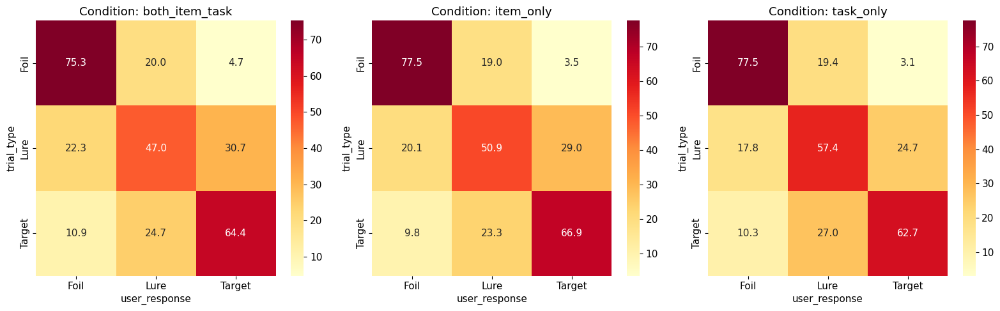

In [9]:
# =========================
# CONFUSION MATRIX
# =========================

conditions = sorted(df["condition"].unique())

fig, axes = plt.subplots(1, len(conditions), figsize=(16,5))

for i, cond in enumerate(conditions):

    subset = df[df["condition"] == cond]

    confusion = pd.crosstab(
        subset["trial_type"],
        subset["user_response"],
        normalize="index"
    ) * 100

    sns.heatmap(
        confusion,
        annot=True,
        fmt=".1f",
        cmap="YlOrRd",
        ax=axes[i]
    )

    axes[i].set_title(f"Condition: {cond}")

plt.tight_layout()
plt.show()

## REC Distribution Aanlysis

In [10]:
# REC distribution per condition(item_only, both, task_only) and per position (mid,pre,post)

def plot_rec_distribution(rec_df, condition, position):
    
    """
    Plot the REC distribution for a given condition and boundary position.
    
    Parameters:
    rec_df : DataFrame containing REC scores
    condition : string (e.g., 'item_only', 'task_only', 'both_item_task')
    position : string (e.g., 'Pre', 'Mid', 'Post')
    """
    
    # Filter the data
    subset = rec_df[
        (rec_df["condition"] == condition) &
        (rec_df["boundary_position"] == position)
    ]
    
    if subset.empty:
        print("No data found for this condition and position.")
        return
    
    # Plot distribution
    plt.figure(figsize=(8,5))
    
    sns.histplot(
        subset["REC"],
        bins=15,
        kde=True
    )
    
    plt.title(f"REC Distribution\nCondition: {condition} | Boundary: {position}")
    plt.xlabel("REC Score")
    plt.ylabel("Frequency")
    
    plt.show()

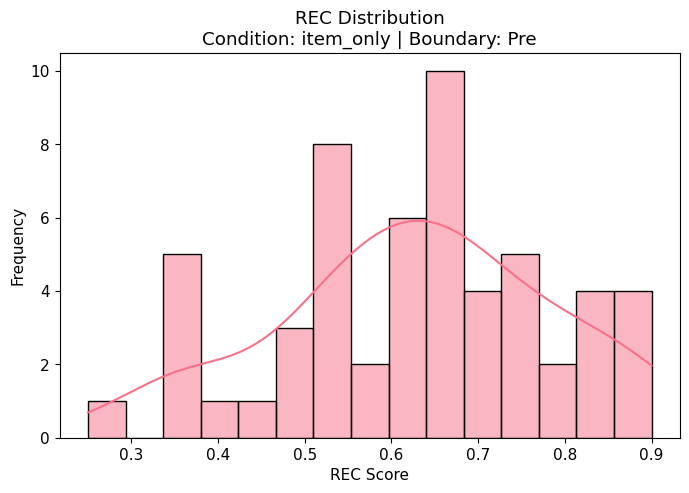

In [11]:
plot_rec_distribution(rec_df, "item_only", "Pre")

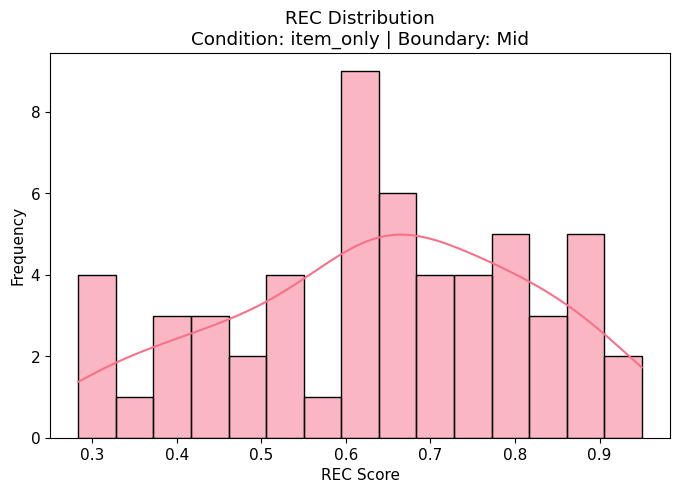

In [12]:
plot_rec_distribution(rec_df, "item_only", "Mid")

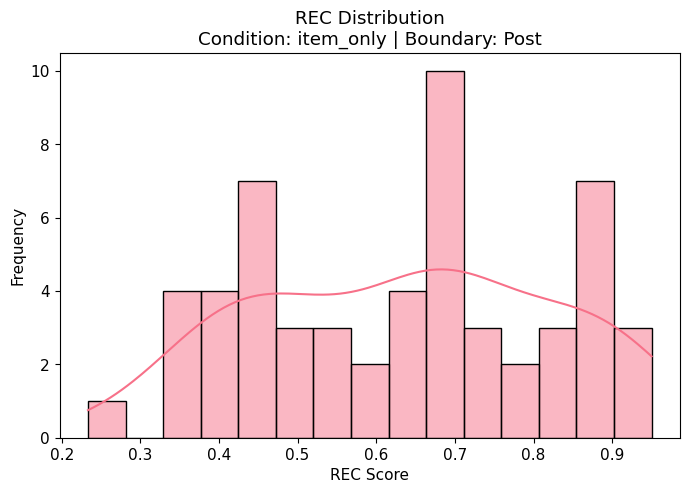

In [13]:
plot_rec_distribution(rec_df, "item_only", "Post")

In [14]:
def plot_rec_distribution_by_condition(rec_df, condition):
    
    """
    Plot REC distributions for Pre, Mid, and Post positions
    for a given condition.
    
    Parameters
    ----------
    rec_df : DataFrame
        DataFrame containing REC values
    condition : str
        Condition name (e.g., 'item_only', 'task_only', 'both_item_task')
    """
    
    # Filter dataset for selected condition
    subset = rec_df[rec_df["condition"] == condition]
    
    positions = ["Pre", "Mid", "Post"]
    
    fig, axes = plt.subplots(1, 3, figsize=(15,5))
    
    for i, pos in enumerate(positions):
        
        pos_data = subset[subset["boundary_position"] == pos]
        
        sns.histplot(
            pos_data["REC"],
            bins=15,
            kde=True,
            ax=axes[i]
        )
        
        axes[i].set_title(f"{pos} Boundary")
        axes[i].set_xlabel("REC Score")
        axes[i].set_ylabel("Frequency")
    
    fig.suptitle(f"REC Distribution Across Boundary Positions\nCondition: {condition}", fontsize=14)
    
    plt.tight_layout()
    plt.show()

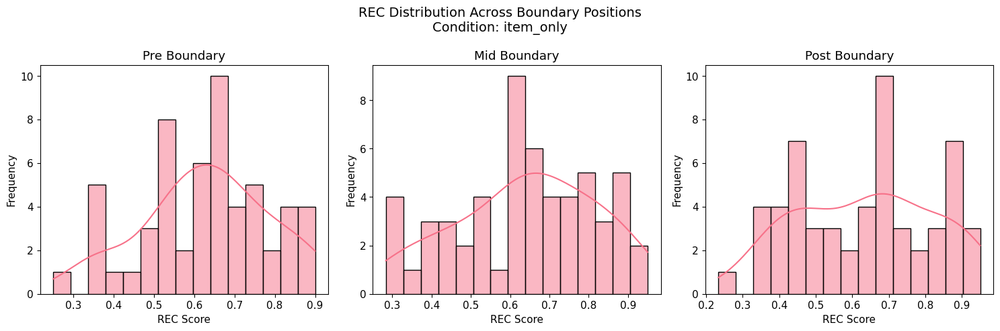

In [15]:
plot_rec_distribution_by_condition(rec_df, "item_only")

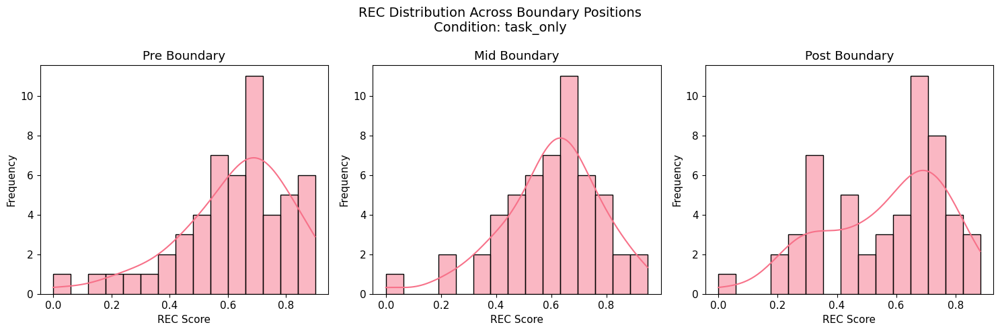

In [16]:
plot_rec_distribution_by_condition(rec_df, "task_only")

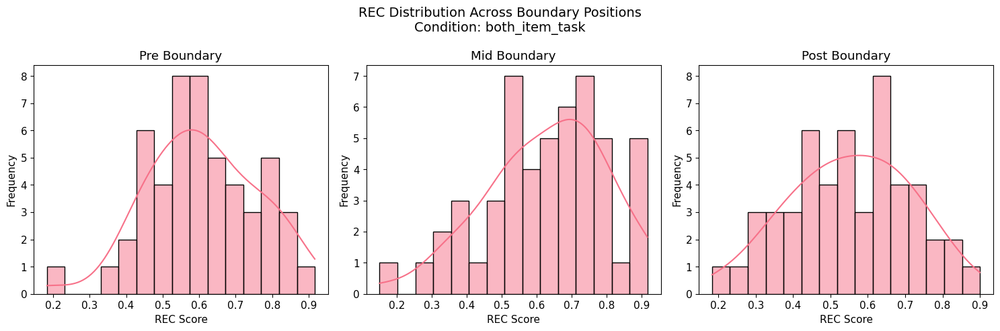

In [17]:
plot_rec_distribution_by_condition(rec_df, "both_item_task")

## LDI Analysis

In [18]:
# =========================
# CALCULATE LDI SCORE
# =========================

rows = []

# Group data by participant and condition
for (participant, condition), subset in df.groupby(["participant_id", "condition"]):

    # False lure rate
    foil_lure = probability_of_response(subset, "Foil", "Lure")

    # Compute LDI for each boundary
    for boundary in ["Pre", "Mid", "Post"]:

        lure_correct = probability_of_response(
            subset,
            trial_type="Lure",
            response="Lure",
            boundary=boundary
        )

        ldi = lure_correct - foil_lure

        rows.append({
            "participant_id": participant,
            "condition": condition,
            "boundary_position": boundary,
            "LDI": ldi
        })

ldi_df = pd.DataFrame(rows)

            participant_id       condition          image_path trial_type  \
8400  both_item_task_00015  both_item_task   Foils\scenes9.jpg       Foil   
8403  both_item_task_00015  both_item_task      Foils\074a.jpg       Foil   
8405  both_item_task_00015  both_item_task      Foils\010a.jpg       Foil   
8413  both_item_task_00015  both_item_task      Foils\050a.jpg       Foil   
8429  both_item_task_00015  both_item_task   Foils\scenes4.jpg       Foil   
8430  both_item_task_00015  both_item_task   Foils\scenes8.jpg       Foil   
8435  both_item_task_00015  both_item_task  Foils\scenes15.jpg       Foil   
8436  both_item_task_00015  both_item_task      Foils\113a.jpg       Foil   
8437  both_item_task_00015  both_item_task      Foils\093b.jpg       Foil   
8438  both_item_task_00015  both_item_task  Foils\scenes27.jpg       Foil   
8441  both_item_task_00015  both_item_task  Foils\scenes28.jpg       Foil   
8443  both_item_task_00015  both_item_task  Foils\scenes13.jpg       Foil   

In [19]:
def plot_ldi_distribution_by_condition(ldi_df, condition):
    
    """
    Plot LDI distributions for Pre, Mid, and Post boundary positions
    for a given condition.
    
    Parameters
    ----------
    ldi_df : DataFrame
        DataFrame containing LDI scores
    condition : str
        Condition name (e.g., 'item_only', 'task_only', 'both_item_task')
    """

    # Filter dataframe for the selected condition
    subset = ldi_df[ldi_df["condition"] == condition]

    positions = ["Pre", "Mid", "Post"]

    fig, axes = plt.subplots(1, 3, figsize=(15,5))

    for i, pos in enumerate(positions):

        pos_data = subset[subset["boundary_position"] == pos]

        sns.histplot(
            pos_data["LDI"],
            bins=15,
            kde=True,
            ax=axes[i]
        )

        # Mean line
        mean_val = pos_data["LDI"].mean()
        axes[i].axvline(mean_val, color="red", linestyle="--")

        axes[i].set_title(f"{pos} Boundary")
        axes[i].set_xlabel("LDI Score")
        axes[i].set_ylabel("Frequency")

    fig.suptitle(f"LDI Distribution Across Boundary Positions\nCondition: {condition}", fontsize=14)

    plt.tight_layout()
    plt.show()

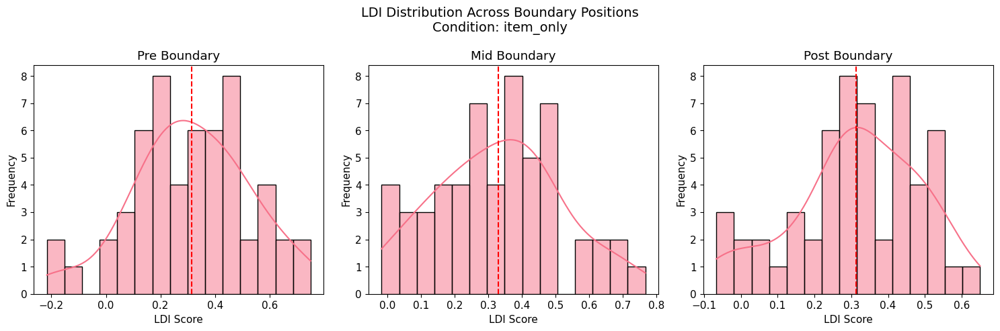

In [20]:
plot_ldi_distribution_by_condition(ldi_df, "item_only")

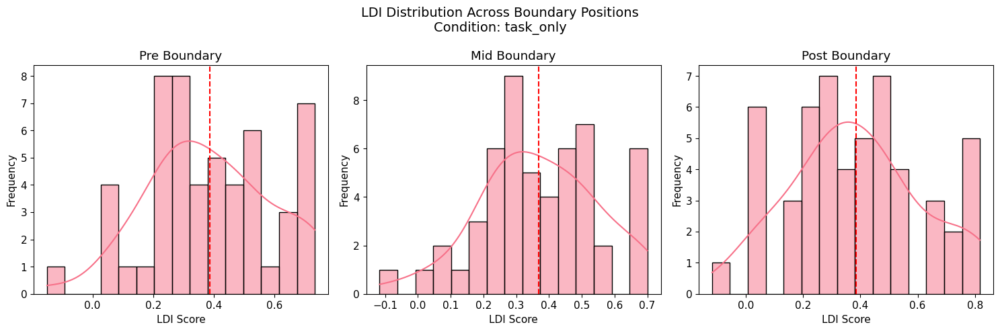

In [21]:
plot_ldi_distribution_by_condition(ldi_df, "task_only")

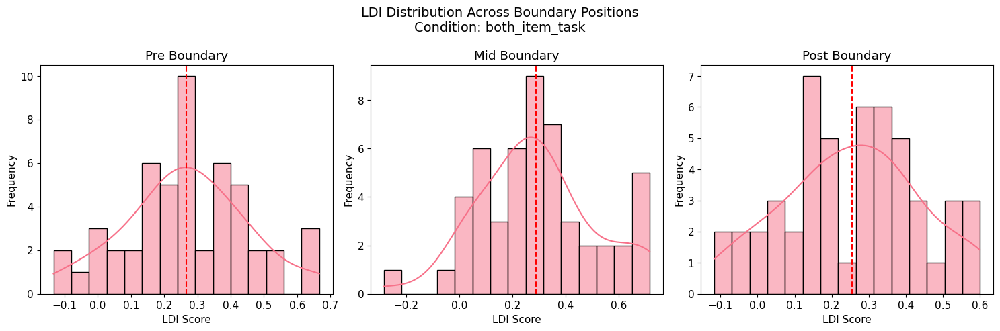

In [22]:
plot_ldi_distribution_by_condition(ldi_df, "both_item_task")

# Shapiro–Wilk Test for Normality

The **Shapiro–Wilk test** is a statistical test used to determine whether a dataset comes from a **normally distributed population**.

Normality testing is important because many statistical methods (like **t-tests, ANOVA, and regression assumptions**) require that the data follows a **normal distribution**.

---

# 1. What is a Normal Distribution?

A **normal distribution** is a symmetric bell-shaped distribution where:

- The **mean**, **median**, and **mode** are equal.
- Most values lie near the center.
- The probability decreases symmetrically as we move away from the mean.

Properties:

- 68% of data lies within **1 standard deviation**
- 95% within **2 standard deviations**
- 99.7% within **3 standard deviations**

Many natural and experimental measurements approximately follow this distribution.

---

# 2. Why Do We Test for Normality?

Many statistical tests assume that the data is normally distributed.

Examples:

- **t-test**
- **ANOVA**
- **Linear regression residual assumptions**

If data is **not normal**, these tests may produce incorrect conclusions.

In such cases, researchers often use **non-parametric tests** instead.

Example:

| Parametric Test | Non-Parametric Alternative |
|----------------|---------------------------|
| t-test | Wilcoxon test |
| ANOVA | Kruskal–Wallis test |

---

# 3. What Does the Shapiro–Wilk Test Do?

The Shapiro–Wilk test evaluates whether a sample of data is **consistent with a normal distribution**.

It does this by comparing:

- the **actual order of sample values**
- with the **expected order if the data were perfectly normal**

If the sample closely matches what we would expect from a normal distribution, the test statistic will indicate normality.

---

# 4. Hypotheses of the Test

The Shapiro–Wilk test uses the following hypotheses:

**Null Hypothesis (H₀):**  
The data follows a **normal distribution**.

**Alternative Hypothesis (H₁):**  
The data **does not follow** a normal distribution.

---

# 5. Test Statistic

The Shapiro–Wilk statistic is denoted by **W**.

The formula is:

$$W = \frac{(\sum_{i=1}^{n} a_i x_{(i)})^2}{\sum_{i=1}^{n} (x_i - \bar{x})^2}$$

Where:

- \( x_{(i)} \) = ordered sample values
- \( \bar{x} \) = sample mean
- \( a_i \) = constants derived from expected normal order statistics
- \( n \) = sample size

Interpretation:

- **W close to 1 → data is likely normal**
- **W much smaller than 1 → data deviates from normality**

The constants \(a_i\) are computed from properties of the **expected values of order statistics from a normal distribution**.

---

# 6. P-Value Interpretation

After computing the statistic \(W\), the test produces a **p-value**.

Decision rule:

| p-value | Interpretation |
|-------|---------------|
| p > 0.05 | Data is likely normal (fail to reject H₀) |
| p ≤ 0.05 | Data is not normal (reject H₀) |

In [23]:
from scipy.stats import shapiro


def test_normality_by_position(data, metric, condition, alpha=0.05):
    """
    Test normality (Shapiro-Wilk) for each boundary position
    and visualize results as a table image.

    Parameters
    ----------
    data : DataFrame
    metric : str ("REC" or "LDI")
    condition : str
    alpha : float
        Significance threshold (default=0.05)
    """

    subset = data[data["condition"] == condition]
    positions = ["Pre", "Mid", "Post"]

    results = []

    for pos in positions:
        pos_data = subset[subset["boundary_position"] == pos][metric].dropna()

        if len(pos_data) < 3:
            stat, p_value = np.nan, np.nan
            interpretation = "Insufficient sample (n < 3)"
        else:
            stat, p_value = shapiro(pos_data)
            interpretation = (
                "Distribution looks NORMAL"
                if p_value > alpha
                else "Distribution is NOT normal"
            )

        results.append(
            {
                "Boundary Position": pos,
                "N": len(pos_data),
                "Shapiro W": stat,
                "P-value": p_value,
                "Result": interpretation,
            }
        )

    results_df = pd.DataFrame(results)

    # -------- Table Image --------
    table_df = results_df.copy()
    table_df["Shapiro W"] = table_df["Shapiro W"].map(
        lambda x: "-" if pd.isna(x) else f"{x:.4f}"
    )
    table_df["P-value"] = table_df["P-value"].map(
        lambda x: "-" if pd.isna(x) else f"{x:.4f}"
    )

    fig_height = 1.5 + 0.55 * len(table_df)
    fig, ax = plt.subplots(figsize=(11, fig_height))
    ax.axis("off")

    table = ax.table(
        cellText=table_df.values,
        colLabels=table_df.columns,
        cellLoc="center",
        loc="center",
    )

    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 1.4)

    # Header styling
    for col in range(len(table_df.columns)):
        table[(0, col)].set_facecolor("#D9EAF7")
        table[(0, col)].set_text_props(weight="bold")

    plt.title(
        f"Shapiro-Wilk Normality Test | {metric} | Condition: {condition}",
        fontsize=12,
        pad=12,
    )
    plt.tight_layout()
    plt.show()

    return results_df

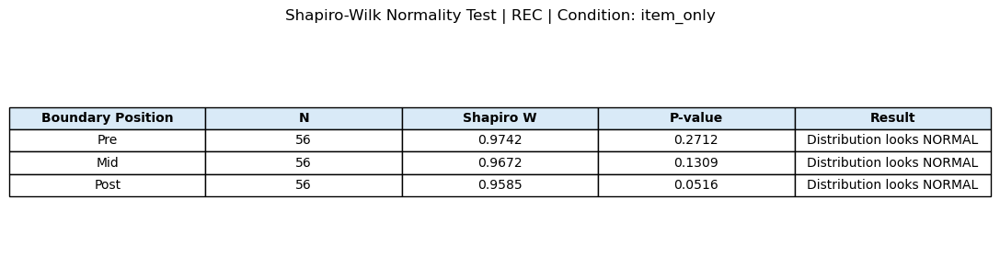

,Boundary Position,N,Shapiro W,P-value,Result
0,Pre,56,0.974185,0.271245,Distribution looks NORMAL
1,Mid,56,0.967214,0.130875,Distribution looks NORMAL
2,Post,56,0.958472,0.051583,Distribution looks NORMAL


In [24]:
test_normality_by_position(rec_df, "REC", "item_only")

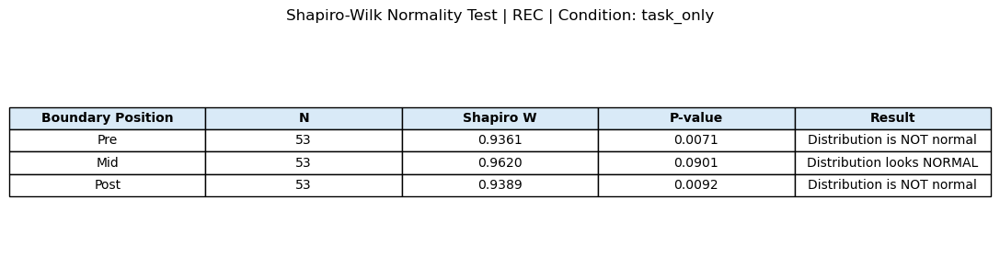

,Boundary Position,N,Shapiro W,P-value,Result
0,Pre,53,0.936122,0.007096,Distribution is NOT normal
1,Mid,53,0.962012,0.090082,Distribution looks NORMAL
2,Post,53,0.938890,0.009197,Distribution is NOT normal


In [25]:
test_normality_by_position(rec_df, "REC", "task_only")

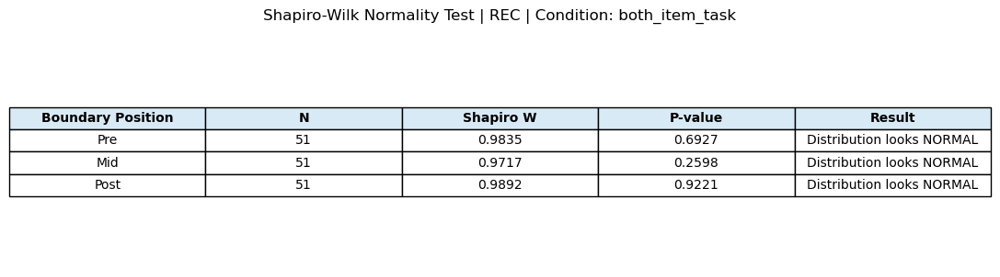

,Boundary Position,N,Shapiro W,P-value,Result
0,Pre,51,0.983465,0.692735,Distribution looks NORMAL
1,Mid,51,0.971697,0.259816,Distribution looks NORMAL
2,Post,51,0.989231,0.922074,Distribution looks NORMAL


In [26]:
test_normality_by_position(rec_df, "REC", "both_item_task")

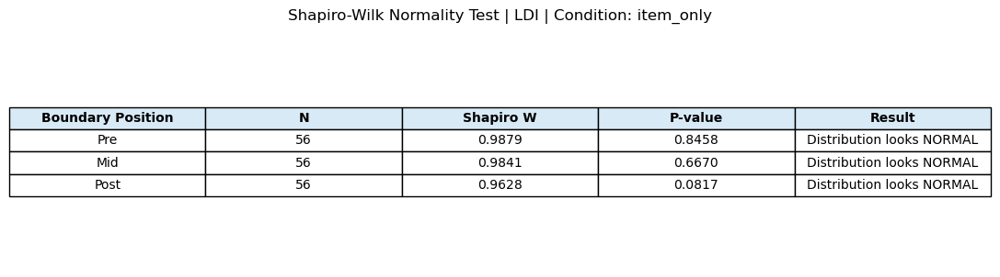

,Boundary Position,N,Shapiro W,P-value,Result
0,Pre,56,0.987905,0.845817,Distribution looks NORMAL
1,Mid,56,0.984101,0.666952,Distribution looks NORMAL
2,Post,56,0.962798,0.081735,Distribution looks NORMAL


In [27]:
test_normality_by_position(ldi_df, "LDI", "item_only")

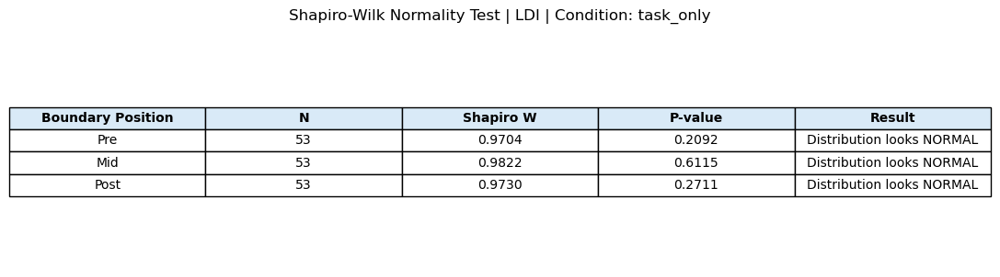

,Boundary Position,N,Shapiro W,P-value,Result
0,Pre,53,0.970363,0.209248,Distribution looks NORMAL
1,Mid,53,0.982210,0.611484,Distribution looks NORMAL
2,Post,53,0.973000,0.271061,Distribution looks NORMAL


In [28]:
test_normality_by_position(ldi_df, "LDI", "task_only")

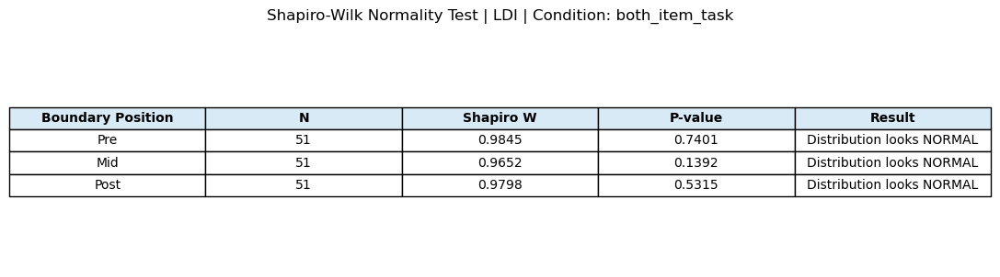

,Boundary Position,N,Shapiro W,P-value,Result
0,Pre,51,0.984515,0.740145,Distribution looks NORMAL
1,Mid,51,0.965223,0.139244,Distribution looks NORMAL
2,Post,51,0.979826,0.531487,Distribution looks NORMAL


In [29]:
test_normality_by_position(ldi_df, "LDI", "both_item_task")

# Mean REC/LDI Summary table

In [30]:
rec_df.groupby(["condition","boundary_position"])["REC"].agg(["mean","std","count"])

mean       std  count
condition      boundary_position                           
both_item_task Mid                0.627451  0.171167     51
               Post               0.553922  0.162022     51
               Pre                0.609804  0.151334     51
item_only      Mid                0.639881  0.178056     56
               Post               0.634524  0.188102     56
               Pre                0.627381  0.157199     56
task_only      Mid                0.600629  0.182895     53
               Post               0.562893  0.204350     53
               Pre                0.624214  0.194847     53

In [31]:
ldi_df.groupby(["condition","boundary_position"])["LDI"].agg(["mean","std","count"])

mean       std  count
condition      boundary_position                           
both_item_task Mid                0.289216  0.218551     51
               Post               0.254902  0.184641     51
               Pre                0.266667  0.185652     51
item_only      Mid                0.329762  0.188179     56
               Post               0.313690  0.172243     56
               Pre                0.313690  0.213203     56
task_only      Mid                0.368553  0.180267     53
               Post               0.385535  0.228826     53
               Pre                0.387421  0.204618     53

# Condition Comparison 

<AxesSubplot: xlabel='condition', ylabel='REC'>

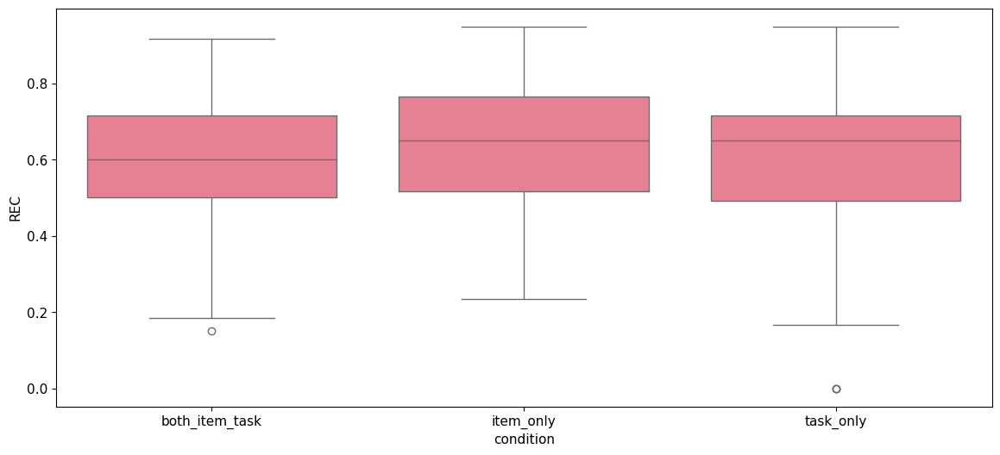

In [32]:
sns.boxplot(
    data=rec_df,
    x="condition",
    y="REC"
)

<AxesSubplot: xlabel='condition', ylabel='LDI'>

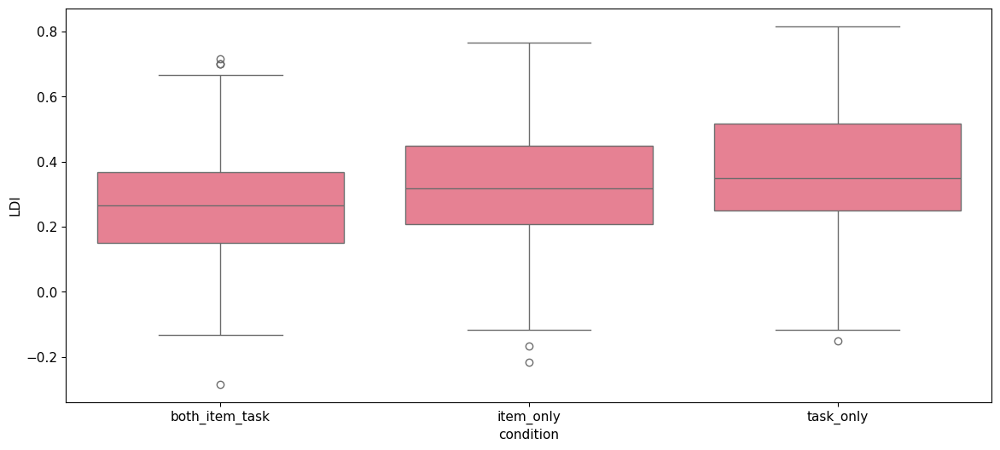

In [33]:
sns.boxplot(
    data=ldi_df,
    x="condition",
    y="LDI"
)

# Combined Visualization

<AxesSubplot: xlabel='boundary_position', ylabel='REC'>

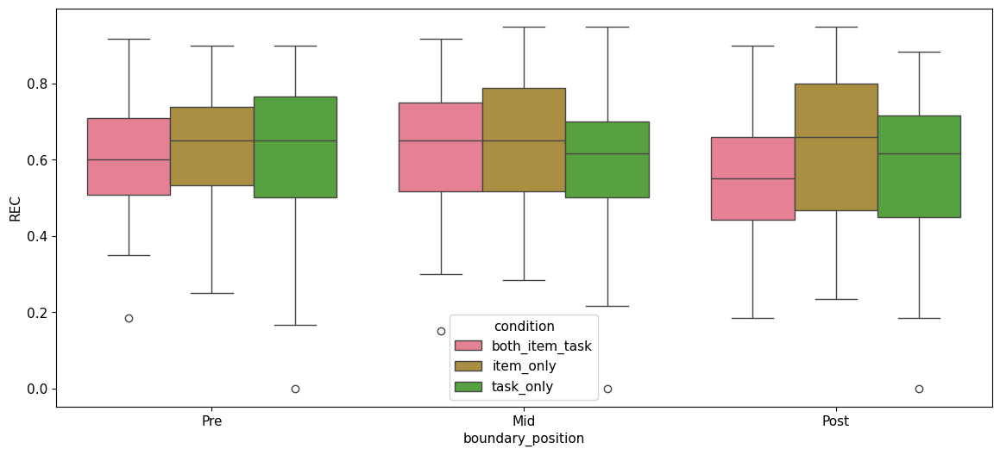

In [34]:
sns.boxplot(
    data=rec_df,
    x="boundary_position",
    y="REC",
    hue="condition"
)

<AxesSubplot: xlabel='REC', ylabel='Density'>

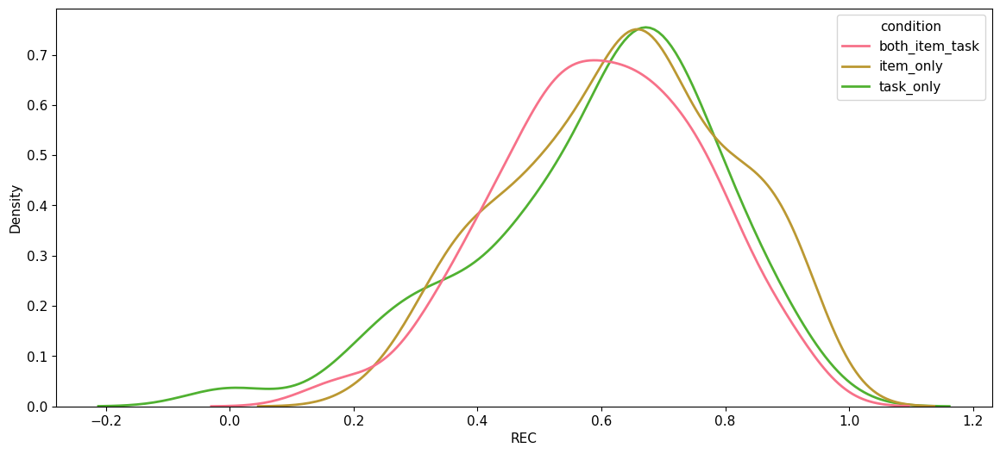

In [41]:
sns.kdeplot(
    data=rec_df,
    x="REC",
    hue="condition",
    linewidth=2  # Makes the lines slightly thicker and easier to read
)

<AxesSubplot: xlabel='LDI', ylabel='Density'>

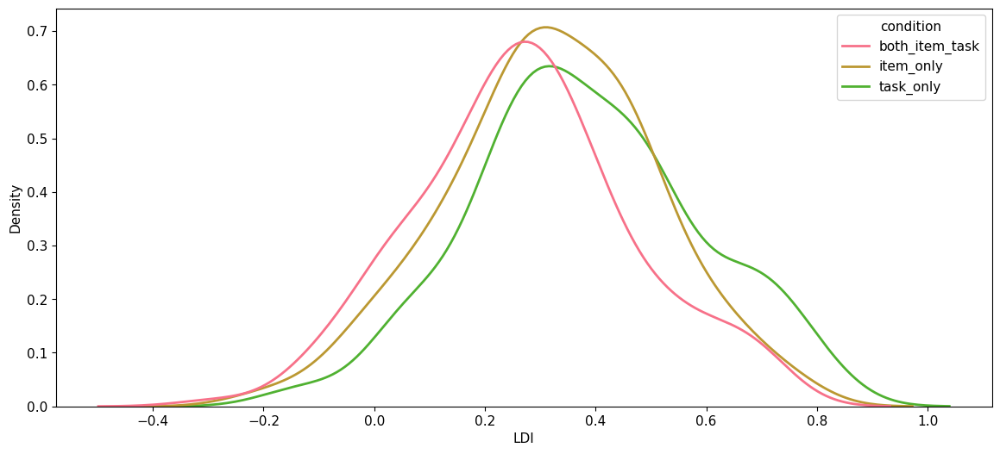

In [42]:
sns.kdeplot(
    data=ldi_df,
    x="LDI",
    hue="condition",
    linewidth=2  # Makes the lines slightly thicker and easier to read
)

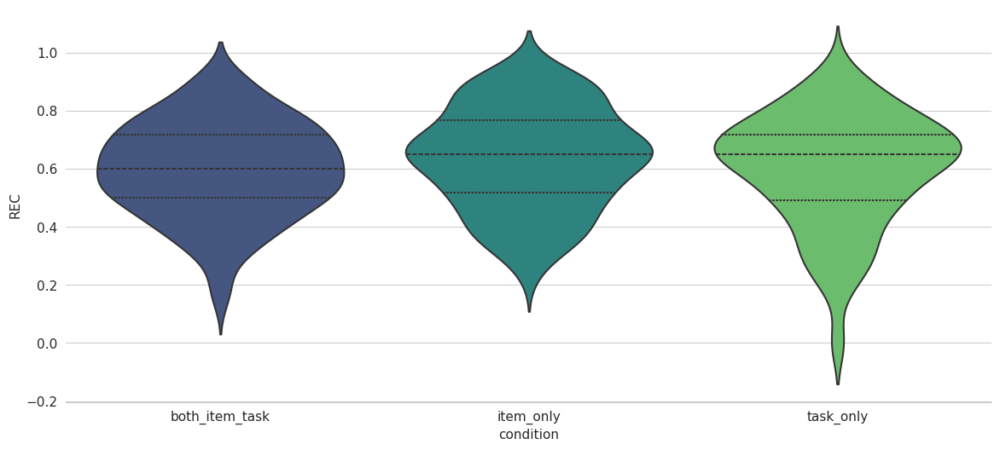

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Set a clean, modern background (removes the gray, adds subtle gridlines)
sns.set_style("whitegrid")

# 2. Create the violin plot with upgraded aesthetics
sns.violinplot(
    data=rec_df,
    x="condition",
    y="REC",
    palette="viridis",        # The "cool" color theme. Try "viridis" or "crest" too!
    linewidth=1.5,         # Gives the violins crisper, thicker outlines
    inner="quartile",      # Replaces the default mini-box with sleek quartile lines
    density_norm="width"   # Ensures all violins scale uniformly, looking much neater
)

# 3. Remove the top and right borders for a minimalist look
sns.despine(left=True)

plt.show()

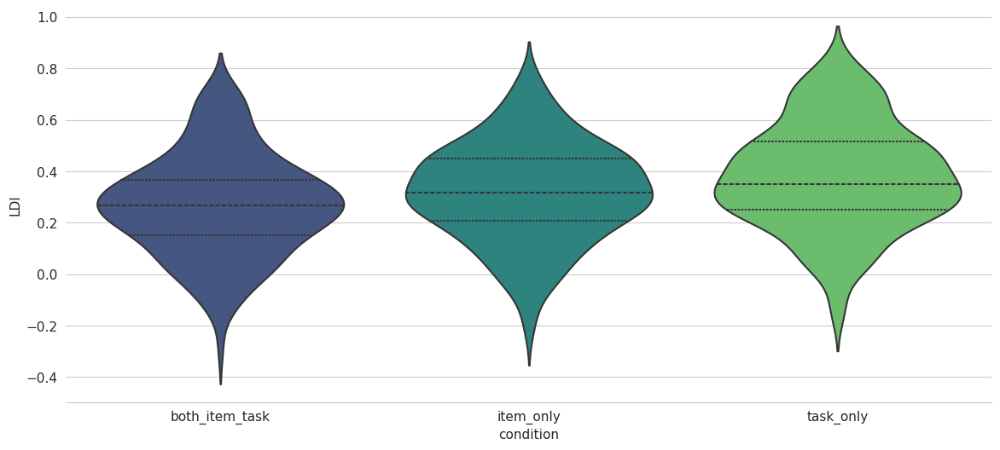

In [47]:
# 1. Set a clean, modern background (removes the gray, adds subtle gridlines)
sns.set_style("whitegrid")

# 2. Create the violin plot with upgraded aesthetics
sns.violinplot(
    data=ldi_df,
    x="condition",
    y="LDI",
    palette="viridis",        # The "cool" color theme. Try "viridis" or "crest" too!
    linewidth=1.5,         # Gives the violins crisper, thicker outlines
    inner="quartile",      # Replaces the default mini-box with sleek quartile lines
    density_norm="width"   # Ensures all violins scale uniformly, looking much neater
)

# 3. Remove the top and right borders for a minimalist look
sns.despine(left=True)

plt.show()

# REC vs LDI Comparison

In [36]:
metrics_df = pd.merge(
    rec_df,
    ldi_df,
    on=["participant_id","condition","boundary_position"]
)

<AxesSubplot: xlabel='REC', ylabel='LDI'>

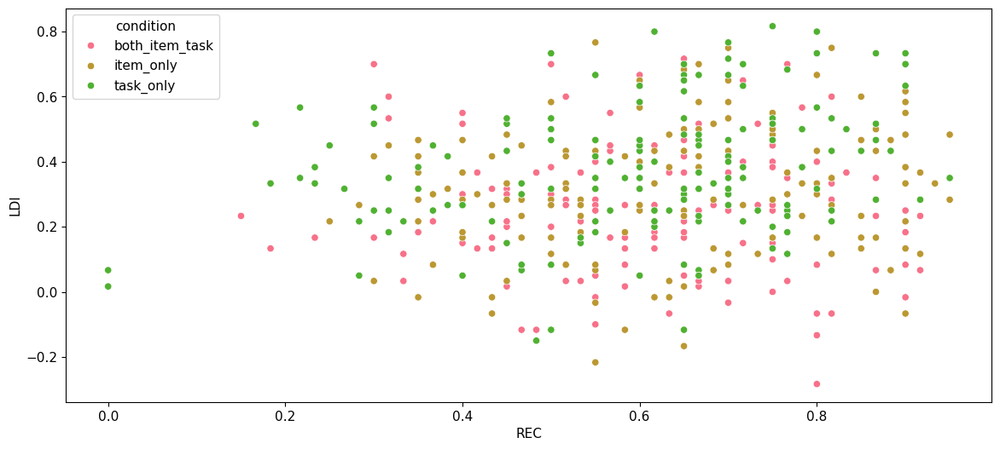

In [37]:
sns.scatterplot(
    data=metrics_df,
    x="REC",
    y="LDI",
    hue="condition"
)

Condition wise comparison

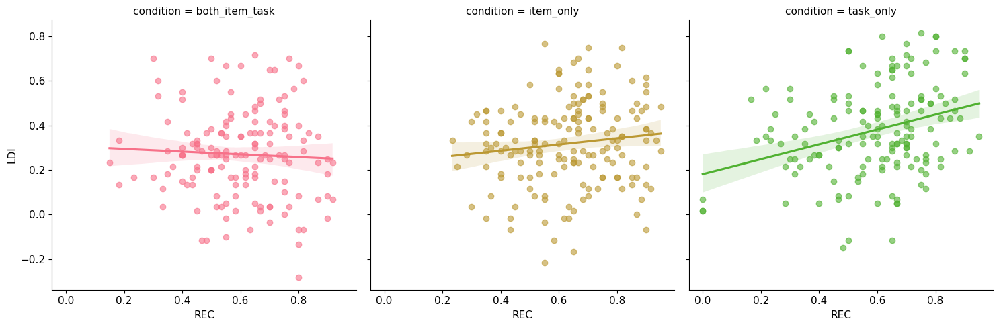

In [38]:
sns.lmplot(
    data=metrics_df,
    x="REC",
    y="LDI",
    col="condition",
    hue="condition",
    height=5,
    aspect=1,
    scatter_kws={"alpha":0.6}
)

1. In the item-only condition, a weak positive relationship between REC and LDI was observed, suggesting that recognition memory and lure discrimination abilities are only loosely related.
2. In the both-item-task condition, the relationship between REC and LDI appears minimal, suggesting that recognition performance does not strongly predict lure discrimination ability in this task setting.
3. The task-only condition shows a stronger positive relationship between REC and LDI, indicating that participants who perform well in recognition also tend to exhibit better lure discrimination when the task demands are simplified.